In [1]:

using Plots
plotlyjs()

┌ Warning: backend `PlotlyJS` is not installed.
└ @ Plots /Users/ferreol/.julia/packages/Plots/Ec1L1/src/backends.jl:45


Plots.PlotlyJSBackend()

In [2]:
using Revise, EasyFITS,Statistics, ArrayTools,StatsBase, LinearAlgebra,InterpolationKernels
using ReducingGravity

In [3]:


dirpath = "/Users/ferreol/Data/RawData/GRAVITY+/AntoineMerand"
wavepath = "/Users/ferreol/Data/RawData/GRAVITY+/AntoineMerand/reduced_vfactor/GRAVI.2021-10-01T12:04:42.600_wave.fits"

flist = ReducingGravity.listfitsfiles(dirpath);

# Illumination size estimation
Δtflat = first(filter(x -> occursin("FLAT1", x.second.type), flist)).second.Δt
fdark = openfits(first(filter(x -> (occursin(r"(DARK)", x.second.type) && x.second.Δt==Δtflat), flist)).first);
(illuminated,bboxes) = gravi_data_create_bias_mask(fdark);

# Bad pixel detection
darkflat = read(fdark["IMAGING_DATA_SC"]);
goodpix = gravi_compute_badpix(darkflat,illuminated,spatialkernel=(11,1))
illuminated = illuminated .|| .!goodpix
darkflat,	  = gravi_create_weighteddata(darkflat,illuminated,goodpix)

# Flat dark and P2VM construction from P2VM files
len_p2vm = length(filter(x -> occursin("P2VM", x.second.type), flist))
P2VM = Vector{Pair{String, Array{Float32, 3}}}(undef,len_p2vm)
#P2VMwd = Vector{Pair{String,ConcreteWeightedData{Float32,2}}}(undef,len_p2vm)

Threads.@threads for (i,pv2mfile) ∈ collect(enumerate(values(filter(x -> occursin("P2VM", x.second.type), flist))))
	rawdata =readfits(pv2mfile.path; ext="IMAGING_DATA_SC")
	P2VM[i] = pv2mfile.type => rawdata#gravi_data_detector_cleanup(rawdata,illuminated,keepbias=true)[2]
end
P2VM = Dict(P2VM)

flats,darkp2vm,p2vm,goodpix,chnames = ReducingGravity.gravi_reorder_p2vm(P2VM,bboxes,illuminated,goodpix; filterblink=true,keepbias=true,blinkkernel=9)
profiles = gravi_compute_profile(combine(flats .- [darkp2vm]),bboxes,thrsld=0.1);


In [4]:
profiles = ReducingGravity.gravi_spectral_calibration_pipeline(openfits(wavepath),profiles)




gain, rov = gravi_compute_gain_from_p2vm(flats,darkp2vm,profiles,goodpix)

spctr = gravi_extract_profile_flats_from_p2vm(flats.-[darkp2vm],chnames,profiles)

profiles, lamp = gravi_compute_lamp_transmissions(  spctr, profiles; nb_transmission_knts=300,nb_lamp_knts=300, Chi2=0.5,restart=true)

ron = gravi_compute_ron(darkp2vm,goodpix,gain)
wd = gravi_create_weighteddata(p2vm, illuminated,goodpix, gain,ron)
tλ = ReducingGravity.build_wavelength_range(profiles)

tλ4 = tλ[1:4:end]
itrp4 = ReducingGravity.Interpolator(tλ4,CatmullRomSpline{Float32}())

itrp = ReducingGravity.Interpolator(tλ,CatmullRomSpline{Float32}())

p2v = gravi_extract_profile(wd - darkp2vm.val,profiles )
baseline_phasors, baseline_visibilities = ReducingGravity.gravi_build_p2vm_interf_flat(p2v,spctr, itrp4, profiles, lamp,loop=15)
#baseline_phasors, baseline_visibilities =  gravi_build_p2vm_interf(wd - darkp2vm,itrp, profiles,lamp;loop=5, rgl_phasor=100,rgl_vis=100)


(Array{Float32, 3}[[0.9603605 1.2840141 … 3.570482 3.5633574; 0.89538085 1.2273005 … 1.0956991 1.0802287; 0.09141854 0.09038533 … 2.689254 2.7332597; -1.7319455 -2.363928 … -2.8431318 -2.7379117;;; 0.9493161 1.3293947 … 3.420736 3.431792; 0.90155995 1.2870004 … 1.0541193 1.0503589; 1.7066934 2.4224434 … 3.3054404 3.2425175; -0.1537061 -0.24798201 … 1.7788899 1.8684409;;; 1.2538636 1.728851 … 1.0566797 1.0406016; 0.70566624 0.9723784 … 3.531781 3.5404484; -0.08694101 -0.09342847 … -2.5962784 -2.6396205; 1.7390809 2.4397562 … 2.7342935 2.6547914;;; 1.1862335 1.6972136 … 1.0176224 1.0065829; 0.65954417 0.96069497 … 3.3768783 3.4112487; -1.6313585 -2.3708384 … -3.1947958 -3.1561208; 0.14783493 0.26679558 … -1.712218 -1.7967606], [2.7200205 2.1215637 … 1.2269665 1.2326485; 1.6414701 1.3056669 … 0.19663006 0.19671471; 3.4588125 2.7371814 … -0.29778653 -0.33008283; 1.8341241 1.4291451 … 0.87114304 0.85821825;;; 1.7309095 1.555622 … 1.1991485 1.2048671; 1.055266 0.9674514 … 0.19336417 0.191149

In [5]:
S,λ,wvidx = gravi_build_V2PM(profiles,baseline_phasors)#;λmin=2e-6,λmax=2.5e-6)

wvscfits = readfits(first(filter(x -> (occursin(r"(WAVE,SC)", x.second.type)), flist)).first; ext="IMAGING_DATA_SC");
wvsc =  gravi_create_weighteddata(wvscfits, illuminated,goodpix,gain,ron)
wvsc = ReducingGravity.make_pixels_vector(wvsc - darkflat,profiles,wvidx);
#wvsc = WeightedData(Float64.(wvsc.val[:,2:end]),Float64.(wvsc.precision[:,2:end]))
wvsc = wvsc[:,2:end]
wvcorr = ReducingGravity.get_correlatedflux(S,wvsc)
wvphotometric,wvinterferometric = ReducingGravity.extract_correlated_flux(wvcorr)
bispectra = ReducingGravity.get_bispectrum(wvinterferometric)

4-element Vector{Matrix{ComplexF32}}:
 [0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; … ; 15038.559f0 - 16917.59f0im -17329.732f0 + 1776.8896f0im … 6214.78f0 - 4782.15f0im 17260.707f0 - 25740.646f0im; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im]
 [0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; … ; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 - 0.0f0im; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im]
 [0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im; … ; 37124.45f0 - 8857.227f0im 992.47656f0 - 46471.113f0im … -1725.9744f0 - 2676.7327f0im 8247.454f0 + 897.04425f0im; 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0im 0.0f0 + 0.0f0im]
 [0.0f0 + 0.0f0im 0.0f0 + 0.0f0im … 0.0f0 + 0.0f0i

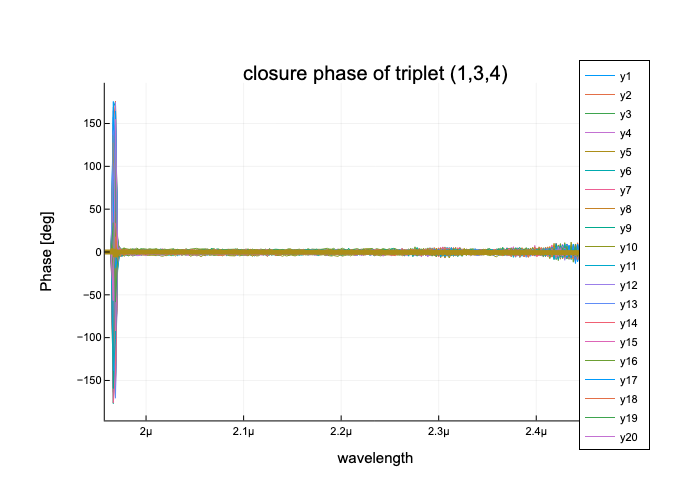

In [65]:
plot(λ, rad2deg.(angle.(bispectra[3][:,1:100])); ticks=:native, title="closure phase of triplet (1,3,4)",xlabel="wavelength",ylabel="Phase [deg]")
C = angle.(dropdims(mean(cat(bispectra...,dims=3),dims=2),dims=2))
plot!(λ, rad2deg.(C[:,3]); ticks=:native,xlabel="wavelength",ylabel="Phase [deg]", width=5)

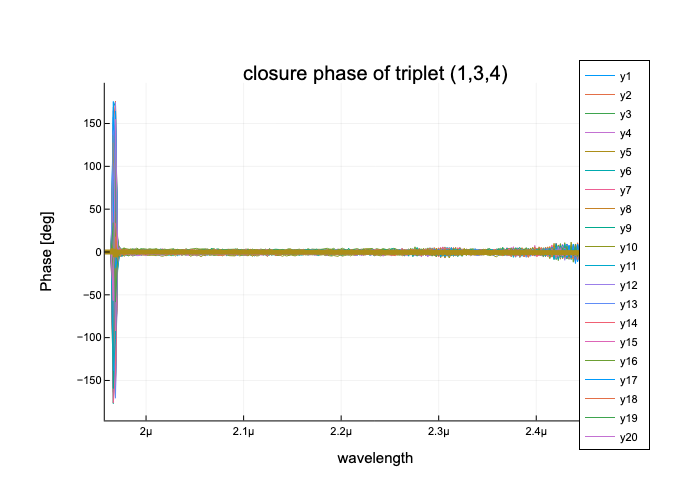

In [8]:
clcorr=ReducingGravity.get_closure_correction(bispectra)
closure_correction = ReducingGravity.make_closure_correction(clcorr)
wvcorr = ReducingGravity.get_correlatedflux(S*closure_correction,wvsc)

wvphotometric,wvinterferometric = ReducingGravity.extract_correlated_flux(wvcorr)
bispectra = ReducingGravity.get_bispectrum(wvinterferometric)

plot(λ, rad2deg.(angle.(bispectra[3][:,1:100])); ticks=:native, title="closure phase of triplet (1,3,4)",xlabel="wavelength",ylabel="Phase [deg]")
C = angle.(dropdims(mean(cat(bispectra...,dims=3),dims=2),dims=2))
plot!(λ, rad2deg.(C[:,3]); ticks=:native,xlabel="wavelength",ylabel="Phase [deg]", width=5)

# re-reducing WAVE,SC data

## computing bispectra
Considering only triplet [1,2,3]

The closure phase of the 512 Wave frames are between -3° and 3°  (they are centered to 0 by construction)

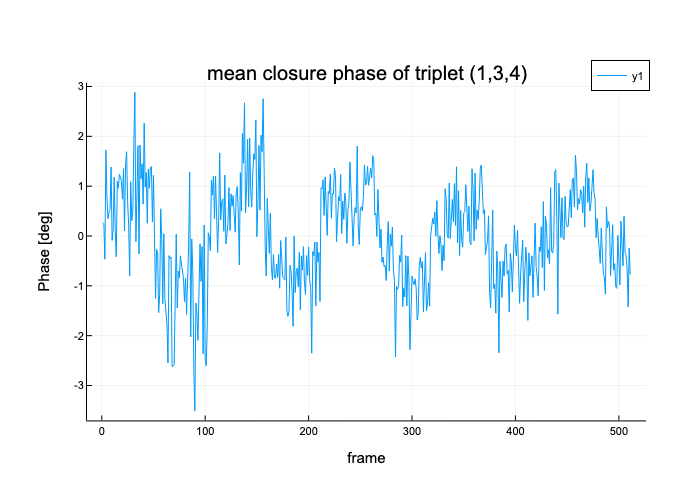

In [10]:
plot(rad2deg.(angle.(mean(bispectra[3][50:200,:],dims=1)))[:]; title="mean closure phase of triplet (1,3,4)",xlabel="frame",ylabel="Phase [deg]")

## Computing group delay
group delay is estimated as the slope of the coherent flux  between channels 50 ($2.06 \mu$m) and 200 ($2.39\mu$m)

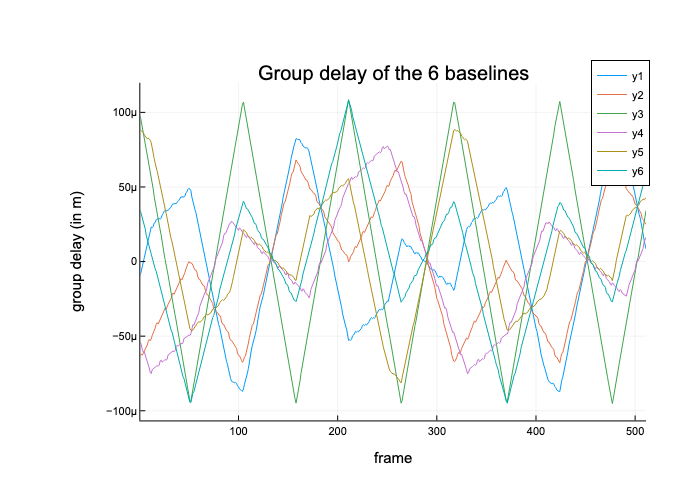

In [78]:
opd,gd = ReducingGravity.compute_opd_gd(wvinterferometric, λ; lmin=50,lmax=70)
plot(gd; ticks=:native, title="Group delay of the 6 baselines",xlabel="frame",ylabel="group delay (in m)")

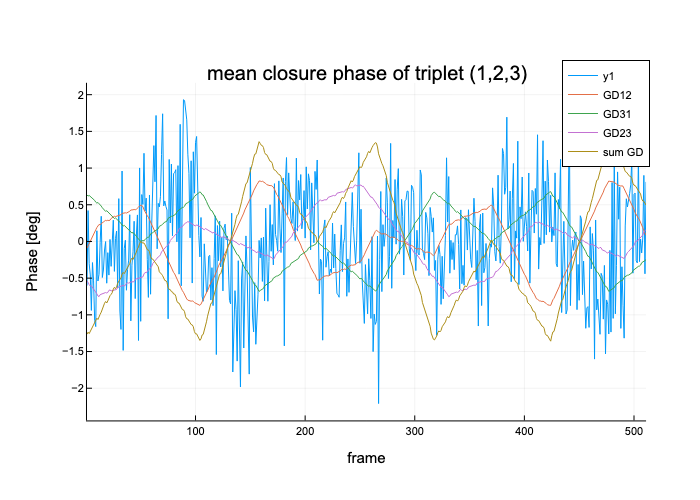

In [79]:
plot(rad2deg.(angle.(mean(bispectra[1][50:200,:],dims=1)))[:]; title="mean closure phase of triplet (1,2,3)",xlabel="frame",ylabel="Phase [deg]")
plot!(gd[1].*10000; ticks=:native, label="GD12")
plot!(-gd[2].*10000; ticks=:native, label="GD31")
plot!(gd[4].*10000; ticks=:native, label="GD23")
plot!((gd[1].+gd[4] .+ gd[2]).*10000; ticks=:native, label="sum GD")
#plot!(Td.*10000; ticks=:native)

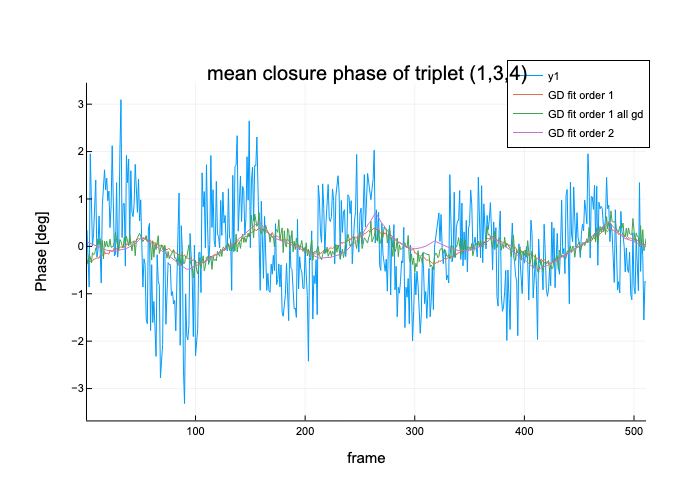

In [80]:
Cl3 = rad2deg.(angle.(mean(bispectra[3][150:160,:],dims=1)))[:]
G = hcat(ones(511),gd[[2,3,6]]...)
C = diagm(1. ./sqrt.(sum(G.^2,dims=1)[:]));
G = G*C

Cl3 = rad2deg.(angle.(mean(bispectra[3][150:160,:],dims=1)))[:]
GA = hcat(ones(511),gd...)
CA = diagm(1. ./sqrt.(sum(GA.^2,dims=1)[:]));
GA = GA*CA

G2 = hcat(gd[[1,3,6]]...).^2
G2 = hcat(ones(511),gd[[1,3,6]]...,G2)
C2 = diagm(1. ./sqrt.(sum(G2.^2,dims=1)[:]));
G2 = G2*C2

plot(Cl3; title="mean closure phase of triplet (1,3,4)",xlabel="frame",ylabel="Phase [deg]")
plot!(G*pinv(G'G)*G'*Cl3; label="GD fit order 1", ticks=:native)
plot!(GA*pinv(GA'GA)*GA'*Cl3; label="GD fit order 1 all gd", ticks=:native)
plot!(G2*pinv(G2'G2)*G2'*Cl3; label="GD fit order 2", ticks=:native)

In [81]:
# First order coefficents
C*pinv(G'G)*G'*Cl3

4-element Vector{Float64}:
       0.015727392875331547
  114849.45867552493
  110310.02601801828
 -112070.91085442269

In [82]:
# First order coefficents all 
CA*pinv(GA'GA)*GA'*Cl3

7-element Vector{Float64}:
       0.005074284697156743
   63978.54706416835
  444173.9148702221
  502834.9781567383
 -823101.1665608381
 -884595.3939869368
  381364.5719491914

In [83]:
 # Second order coefficents

C2*pinv(G2'G2)*G2'*Cl3

7-element Vector{Float64}:
     0.018228597482909666
  1946.696223590167
 -3898.2415243340506
  2827.9337613597845
    -4.760732326168184e7
     4.443664291147062e7
    -3.5737484249613054e7

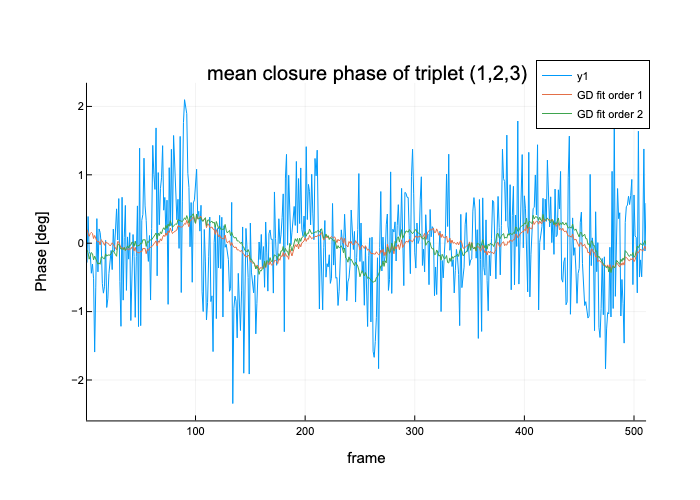

In [84]:
Cl1 = rad2deg.(angle.(mean(bispectra[1][150:160,:],dims=1)))[:]
G = hcat(ones(511),gd[[1,2,4]]...)
C = diagm(1. ./sqrt.(sum(G.^2,dims=1)[:]));
G = G*C

G2 = hcat(gd[[1,2,4]]...).^2
G2 = hcat(ones(511),gd[[1,2,4]]...,G2)
C2 = diagm(1. ./sqrt.(sum(G2.^2,dims=1)[:]));
G2 = G2*C2

plot(Cl1; title="mean closure phase of triplet (1,2,3)",xlabel="frame",ylabel="Phase [deg]")
plot!(G*pinv(G'G)*G'*Cl1; label="GD fit order 1", ticks=:native)
plot!(G2*pinv(G2'G2)*G2'*Cl1; label="GD fit order 2", ticks=:native)

In [85]:
# First order coefficents
C*pinv(G'G)*G'*Cl1

4-element Vector{Float64}:
      -0.002998640100384304
  232238.1619779528
 -236776.5277967623
  234785.60224827626

In [86]:
 # Second order coefficents

C2*pinv(G2'G2)*G2'*Cl1

7-element Vector{Float64}:
       0.1458480768331689
  270419.39509716985
 -275089.39680504875
  272610.7675512464
       3.0362298277604595e7
      -8.495346806288035e7
      -4.983415531036605e7

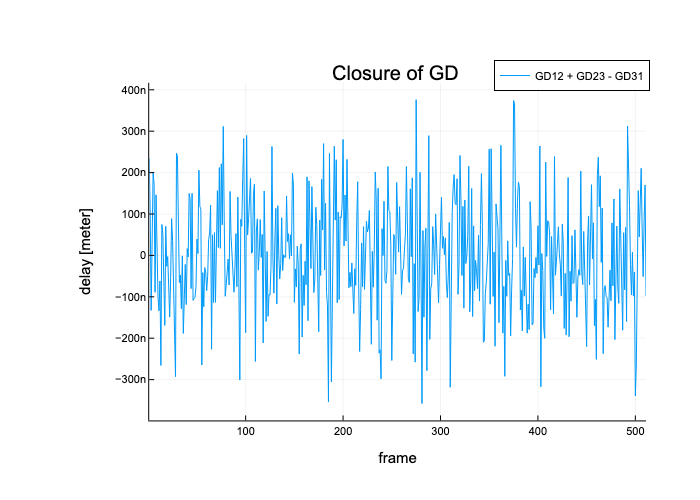

In [87]:
plot((gd[1].+gd[4] .- gd[2]); ticks=:native, label="GD12 + GD23 - GD31", title="Closure of GD ",xlabel="frame",ylabel="delay [meter]")	


delay per telescope

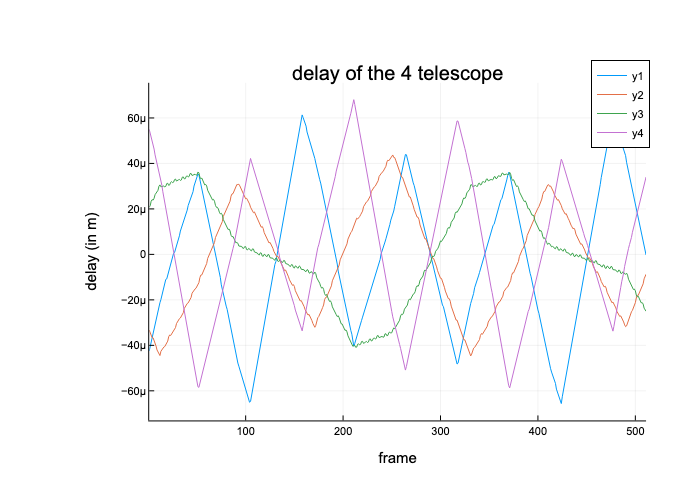

In [88]:
M = [ 1 -1 0 0
       1 0 -1 0
       -1 0 0 1
       0 1 -1 0
       0 -1 0 1
       0 0 -1 1]
Td = pinv(M'M)*M'*gd
plot(Td; ticks=:native, title="delay of the 4 telescope",xlabel="frame",ylabel="delay (in m)")

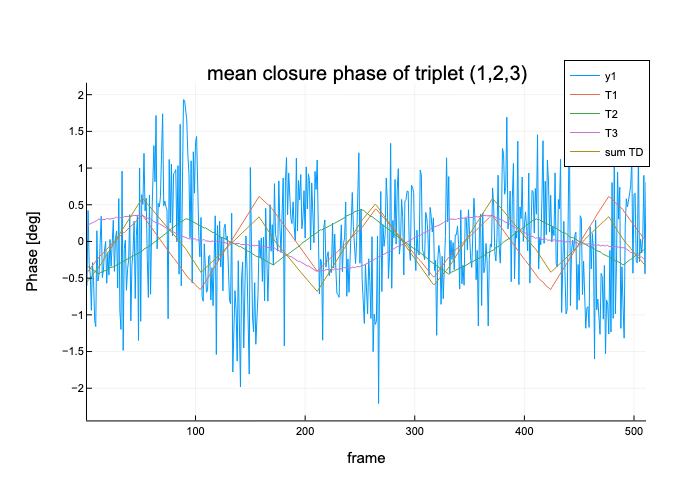

In [89]:
plot(rad2deg.(angle.(mean(bispectra[1][50:200,:],dims=1)))[:]; title="mean closure phase of triplet (1,2,3)",xlabel="frame",ylabel="Phase [deg]")
plot!(Td[1].*10000; ticks=:native, label="T1")
plot!(Td[2].*10000; ticks=:native, label="T2")
plot!(Td[3].*10000; ticks=:native, label="T3")
plot!((Td[1].+Td[2] .+ Td[3]).*10000; ticks=:native, label="sum TD")


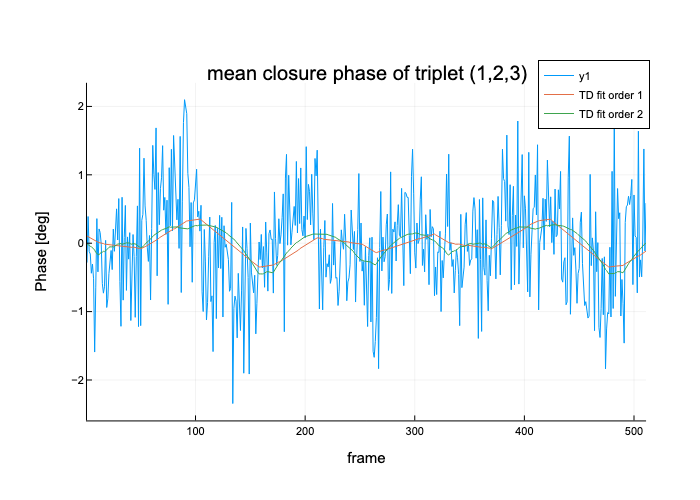

In [90]:
Cl1 = rad2deg.(angle.(mean(bispectra[1][150:160,:],dims=1)))[:]
G = hcat(ones(511),Td...)
C = diagm(1. ./sqrt.(sum(G.^2,dims=1)[:]));
G = G*C

G2 = hcat(Td...).^2
G2 = hcat(ones(511),Td...,G2)
C2 = diagm(1. ./sqrt.(sum(G2.^2,dims=1)[:]));
G2 = G2*C2

plot(Cl1; title="mean closure phase of triplet (1,2,3)",xlabel="frame",ylabel="Phase [deg]")
plot!(G*pinv(G'G)*G'*Cl1; label="TD fit order 1", ticks=:native)
plot!(G2*pinv(G2'G2)*G2'*Cl1; label="TD fit order 2", ticks=:native)

In [91]:
# First order coefficents
C*pinv(G'G)*G'*Cl1

5-element Vector{Float64}:
    -0.0006358384237635784
 -3873.9499216292825
  4007.3670392303616
  3336.2352198222898
    91.16981159542308

In [92]:
 # Second order coefficents

C2*pinv(G2'G2)*G2'*Cl1

9-element Vector{Float64}:
     0.10845144650178454
 -4122.220811871242
  3445.3439153121876
  3467.363273818033
   601.8170412714613
    -2.3366478565578636e7
    -1.7728345469754222e8
     5.272117922270712e7
    -2.2099912174655814e7

In [ ]:
Cl1blue = rad2deg.(angle.(mean(bispectra[1][50:70,:],dims=1)))[:]
Cl1red = rad2deg.(angle.(mean(bispectra[1][200:220,:],dims=1)))[:]

G = hcat(ones(511),Td...)
C = diagm(1. ./sqrt.(sum(G.^2,dims=1)[:]));
G = G*C

G2 = hcat(Td...).^2
G2 = hcat(ones(511),Td...,G2)
C2 = diagm(1. ./sqrt.(sum(G2.^2,dims=1)[:]));
G2 = G2*C2

plot(Cl1blue; title="mean closure phase of triplet (1,2,3)",xlabel="frame",ylabel="Phase [deg]")
plot!(Cl1red; title="mean closure phase of triplet (1,2,3)",xlabel="frame",ylabel="Phase [deg]")
plot!(G*pinv(G'G)*G'*Cl1blue; label="TD blue order 1", ticks=:native)
plot!(G2*pinv(G2'G2)*G2'*Cl1blue; label="TD blue order 2", ticks=:native)
plot!(G*pinv(G'G)*G'*Cl1red; label="TD red order 1", ticks=:native)

MethodError: MethodError: no method matching isless(::ComplexF32, ::ComplexF32)
The function `isless` exists, but no method is defined for this combination of argument types.

Closest candidates are:
  isless(!Matched::Missing, ::Any)
   @ Base missing.jl:87
  isless(::Any, !Matched::Missing)
   @ Base missing.jl:88
  isless(!Matched::Base.BinaryPlatforms.CPUID.ISA, !Matched::Base.BinaryPlatforms.CPUID.ISA)
   @ Base cpuid.jl:22
  ...


In [97]:
# blue First order coefficents
C*pinv(G'G)*G'*Cl1blue 

5-element Vector{Float64}:
     0.0035417267880439394
 -4779.834448862055
  5543.725892686145
  3212.1459481654733
   246.81796296983683

In [98]:
 # red 1st order coefficents

 C*pinv(G'G)*G'*Cl1red

5-element Vector{Float64}:
     0.0034903299160343707
 -3014.904451942151
  3773.6996225959847
  1679.649118218099
   180.43815139705535